In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from plotnine import *
%matplotlib inline

from sklearn import preprocessing
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score, precision_score, recall_score, f1_score, auc
from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve, average_precision_score
from sklearn.model_selection import cross_val_score, cross_val_predict

# Data Preprocessing

In [ ]:
# Load dataset
df = pd.read_csv('2015data.csv')
df.drop(axis=1, columns=['Unnamed: 0'], inplace=True)
df = df[df['ARREST_DATE'] > '2019-01-01'] # change dataset size to be more managable

In [ ]:
df.head()

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lon_Lat
0,236791704,2021-11-22,581.0,NaN,NaN,NaN,PL 2225001,M,M,28,0.0,45-64,M,BLACK,997427.0,230378.0,40.799009,-73.952409,POINT (-73.95240854099995 40.799008797000056)
1,237354740,2021-12-04,153.0,RAPE 3,104.0,RAPE,PL 1302502,F,B,41,0.0,25-44,M,WHITE HISPANIC,1013232.0,236725.0,40.816392,-73.895296,POINT (-73.89529641399997 40.816391847000034)
2,236081433,2021-11-09,681.0,"CHILD, ENDANGERING WELFARE",233.0,SEX CRIMES,PL 2601001,M,Q,113,0.0,25-44,M,BLACK,1046367.0,186986.0,40.679700,-73.776047,POINT (-73.77604736799998 40.67970040800003)
3,192799737,2019-01-26,177.0,SEXUAL ABUSE,116.0,SEX CRIMES,PL 1306503,F,M,25,0.0,45-64,M,BLACK,1000555.0,230994.0,40.800694,-73.941109,POINT (-73.94110928599997 40.800694331000045)
4,193260691,2019-02-06,NaN,NaN,NaN,NaN,PL 2203400,F,M,14,0.0,25-44,M,UNKNOWN,986685.0,215375.0,40.757839,-73.991212,POINT (-73.99121211099998 40.75783900300007)


In [ ]:
# reduce repeated variables
df.drop(axis=1, columns=['X_COORD_CD', 'Y_COORD_CD', 'Lon_Lat'], inplace=True)
df.shape

(509989, 16)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 509989 entries, 0 to 511440
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   ARREST_KEY         509989 non-null  int64  
 1   ARREST_DATE        509989 non-null  object 
 2   PD_CD              509896 non-null  float64
 3   PD_DESC            509690 non-null  object 
 4   KY_CD              509690 non-null  float64
 5   OFNS_DESC          509690 non-null  object 
 6   LAW_CODE           509989 non-null  object 
 7   LAW_CAT_CD         505839 non-null  object 
 8   ARREST_BORO        509989 non-null  object 
 9   ARREST_PRECINCT    509989 non-null  int64  
 10  JURISDICTION_CODE  509989 non-null  float64
 11  AGE_GROUP          509989 non-null  object 
 12  PERP_SEX           509989 non-null  object 
 13  PERP_RACE          509989 non-null  object 
 14  Latitude           509989 non-null  float64
 15  Longitude          509989 non-null  float64
dtypes:

In [ ]:
# check for duplicates 
df.duplicated().sum()

0

In [ ]:
# Check percentage of null values compared
# to total number of dataset observatuions
(df.isnull().sum() /df.shape[0] ) * 100

ARREST_KEY           0.000000
ARREST_DATE          0.000000
PD_CD                0.018236
PD_DESC              0.058629
KY_CD                0.058629
OFNS_DESC            0.058629
LAW_CODE             0.000000
LAW_CAT_CD           0.813743
ARREST_BORO          0.000000
ARREST_PRECINCT      0.000000
JURISDICTION_CODE    0.000000
AGE_GROUP            0.000000
PERP_SEX             0.000000
PERP_RACE            0.000000
Latitude             0.000000
Longitude            0.000000
dtype: float64

As seen above, rows with missing values for some columns compromise very low percentages. For example, for LAW_CAT_CD, only 0.9% of the total observations have missng values. Because the number of missing values are so low compared to our data size, it would be appropriate to drop rows containing missing values. 

We will remove the rows with missing values using the LAW_CAT_CD and OFNS_DESC columns. Choosing these columns will lead to getting rid of all missing value observations.

In [ ]:
# drop nan rows
df = df.dropna(subset=['LAW_CAT_CD', 'OFNS_DESC'])
df.shape

(505540, 16)

In [ ]:
# Change data type to date
df['ARREST_DATE']  = pd.to_datetime(df['ARREST_DATE'])

# columns to be changed to category data type
col = ['PD_CD', 'PD_DESC', 'KY_CD', 'OFNS_DESC','LAW_CODE', 'LAW_CAT_CD',
       'ARREST_BORO', 'ARREST_PRECINCT','JURISDICTION_CODE',
       'AGE_GROUP', 'PERP_SEX', 'PERP_RACE']

# PD_CD, KY_CD, JURISDICTION_CODE do not require decimals
# the following should show that all categories within these varibles have .0 as decimal values that are meaningless
# print(df['PD_CD'].value_counts())
# print(df['KY_CD'].value_counts())
# print(df['JURISDICTION_CODE'].value_counts())

# before changing to category for PD_CD, KY_CD, JURISDICTION_CODE,
# change to int to format the classification codes properly withoud decimals
df['PD_CD'] = df['PD_CD'].astype("int")
df['KY_CD'] = df['KY_CD'].astype("int")
df['JURISDICTION_CODE'] = df['JURISDICTION_CODE'].astype("int")
#  correct data types for the categorical variables
for c in col:
    df[c]  = df[c].astype("category")
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 505540 entries, 1 to 511440
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   ARREST_KEY         505540 non-null  int64         
 1   ARREST_DATE        505540 non-null  datetime64[ns]
 2   PD_CD              505540 non-null  category      
 3   PD_DESC            505540 non-null  category      
 4   KY_CD              505540 non-null  category      
 5   OFNS_DESC          505540 non-null  category      
 6   LAW_CODE           505540 non-null  category      
 7   LAW_CAT_CD         505540 non-null  category      
 8   ARREST_BORO        505540 non-null  category      
 9   ARREST_PRECINCT    505540 non-null  category      
 10  JURISDICTION_CODE  505540 non-null  category      
 11  AGE_GROUP          505540 non-null  category      
 12  PERP_SEX           505540 non-null  category      
 13  PERP_RACE          505540 non-null  category

In [ ]:
df.head()

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,Latitude,Longitude
1,237354740,2021-12-04,153,RAPE 3,104,RAPE,PL 1302502,F,B,41,0,25-44,M,WHITE HISPANIC,40.816392,-73.895296
2,236081433,2021-11-09,681,"CHILD, ENDANGERING WELFARE",233,SEX CRIMES,PL 2601001,M,Q,113,0,25-44,M,BLACK,40.679700,-73.776047
3,192799737,2019-01-26,177,SEXUAL ABUSE,116,SEX CRIMES,PL 1306503,F,M,25,0,45-64,M,BLACK,40.800694,-73.941109
6,236106641,2021-11-10,263,"ARSON 2,3,4",114,ARSON,PL 1501001,F,B,41,72,25-44,M,WHITE HISPANIC,40.804013,-73.878332
7,238383628,2021-12-28,729,"FORGERY,ETC.,UNCLASSIFIED-FELO",113,FORGERY,PL 1702500,F,Q,113,0,18-24,M,BLACK,40.691660,-73.779199


We want to explore if some variables are correlated with each other. For insatnce, the variables PD_CD and KY_CD are likely to be associated since they both hold classification hold with the only difference being that PD_CD is more granular than KY_CD. We want to look at such associations throughout the database features. Since all our variables are categorical, we will apply the CramersV function which is more suitable than trying to compute correlation matrix. 
Note: CramersV will produce numbers ranging from 0 to 1 and is symmetrical.

In [ ]:
# pip install association-metrics

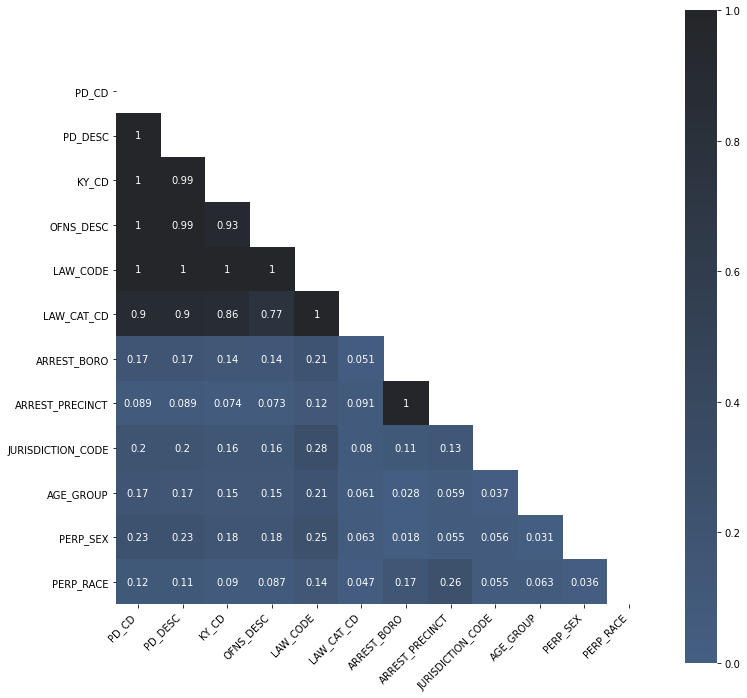

In [ ]:
# Import association_metrics  
import association_metrics as am

# Initialize a CamresV object using you pandas.DataFrame
cramersv = am.CramersV(df) 
# will return a pairwise matrix filled with Cramer's V, where columns and index are 
# the categorical variables of the passed DataFrame
assoc = cramersv.fit()
matrix = np.triu(assoc)  # retrieve only tiangular bottom of the symmetrical matrix

# Heatmap to visualize associations between features
plt.subplots(figsize=(12,12))
ax = sns.heatmap(assoc, mask=matrix, cmap=sns.dark_palette("#69d", reverse=True, as_cmap=True), annot=True,
    vmin=0, vmax=1, center=0, square=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=45,horizontalalignment='right')
plt.savefig('Association.png')

We see that some of the categorical variables ('PD_CD', 'KY_CD', 'PD_DESC','LAW_CODE', 'ARREST_PRECINCT', 'LAW_CAT_CD') are highly associated with other variables like 'OFNS_DESC', 'ARREST_PRECINCT'. Therefore, we can drop them to reduce the dimensions of our dataset.

In [ ]:
# remove associated variables 
df.drop(axis=1, columns=['PD_CD', 'KY_CD', 'PD_DESC','LAW_CODE', 'ARREST_PRECINCT'], inplace=True)

In [ ]:
from scipy.stats import chi2_contingency 

# Chi-squared tests to look at associations
chisqt = pd.crosstab(df.AGE_GROUP, df.LAW_CAT_CD, margins=True)
value = np.array([chisqt.iloc[0][0:5].values,
                  chisqt.iloc[1][0:5].values])
print(chi2_contingency(value)[0:3])

(771.4174624772288, 1.1918192039544272e-165, 4)


In [ ]:
chisqt2 = pd.crosstab(df.AGE_GROUP, df.PERP_RACE, margins=True)
print(chisqt2)

PERP_RACE  AMERICAN INDIAN/ALASKAN NATIVE  ASIAN / PACIFIC ISLANDER   BLACK  \
AGE_GROUP                                                                     
18-24                                 324                      5243   51962   
25-44                                 769                     15084  130327   
45-64                                 260                      6162   48920   
65+                                    17                       653    2815   
<18                                    38                       724   12899   
All                                  1408                     27866  246923   

PERP_RACE  BLACK HISPANIC  UNKNOWN  WHITE  WHITE HISPANIC     All  
AGE_GROUP                                                          
18-24               10337      523   6876           24790  100055  
25-44               24491     1516  33318           71833  277338  
45-64                6461      470  15101           22881  100255  
65+                   436  

In [ ]:
chisqt2 = pd.crosstab(df.AGE_GROUP, df.PERP_SEX, margins=True)
value = np.array([chisqt2.iloc[0][0:5].values,
                  chisqt2.iloc[1][0:5].values])
print(chi2_contingency(value)[0:3])

(54.25203780217128, 1.6569891904275434e-12, 2)


In [ ]:
chisqt3 = pd.crosstab(df.ARREST_BORO, df.PERP_SEX, margins=True)
print(chisqt)

LAW_CAT_CD       F    I       M     V     All
AGE_GROUP                                    
18-24        47059  151   52064   781  100055
25-44       116483  507  158302  2046  277338
45-64        39533  155   59794   773  100255
65+           2506   28    4355   120    7009
<18          13542    4    7306    31   20883
All         219123  845  281821  3751  505540


In [ ]:
chisqt3 = pd.crosstab(df.ARREST_BORO, df.PERP_SEX, margins=True)
value = np.array([chisqt3.iloc[0][0:5].values,
                  chisqt3.iloc[1][0:5].values])
print(chi2_contingency(value)[0:3])

(95.42696862221496, 1.8980036851219296e-21, 2)


In [ ]:
CrosstabResult=pd.crosstab(index=df['AGE_GROUP'],columns=df['PERP_RACE'])
print(CrosstabResult)
 
ChiSqResult = chi2_contingency(CrosstabResult) 
print('The P-Value of the ChiSq Test is:', ChiSqResult[1])

PERP_RACE  AMERICAN INDIAN/ALASKAN NATIVE  ASIAN / PACIFIC ISLANDER   BLACK  \
AGE_GROUP                                                                     
18-24                                 324                      5243   51962   
25-44                                 769                     15084  130327   
45-64                                 260                      6162   48920   
65+                                    17                       653    2815   
<18                                    38                       724   12899   

PERP_RACE  BLACK HISPANIC  UNKNOWN  WHITE  WHITE HISPANIC  
AGE_GROUP                                                  
18-24               10337      523   6876           24790  
25-44               24491     1516  33318           71833  
45-64                6461      470  15101           22881  
65+                   436       30   1602            1456  
<18                  2114       64    822            4222  
The P-Value of the ChiSq T

In [ ]:
CrosstabResult2=pd.crosstab(index=df['ARREST_BORO'],columns=df['PERP_SEX'])
print(CrosstabResult2)

ChiSqResult1 = chi2_contingency(CrosstabResult2) 
print('The P-Value of the ChiSq Test is:', ChiSqResult1[1])

PERP_SEX         F       M
ARREST_BORO               
B            20896   93505
K            23037  114242
M            21967  102707
Q            18539   88319
S             4385   17943
The P-Value of the ChiSq Test is: 4.5933077496993295e-35


# Visualization

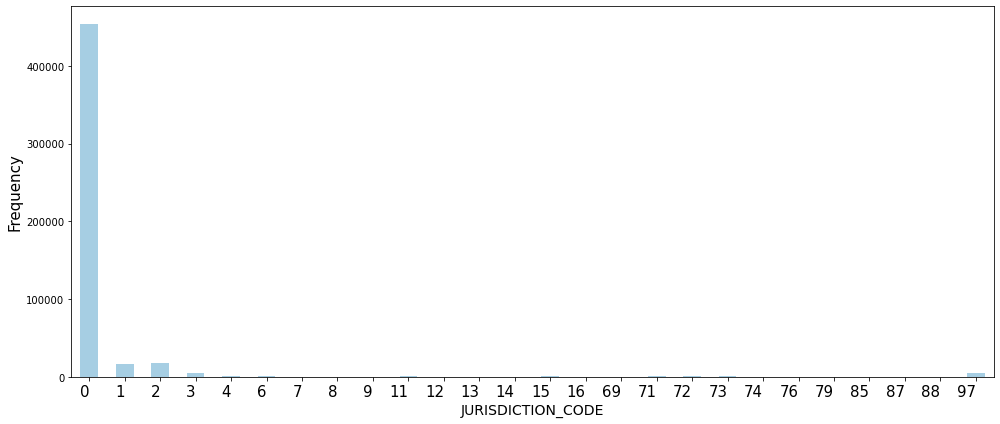

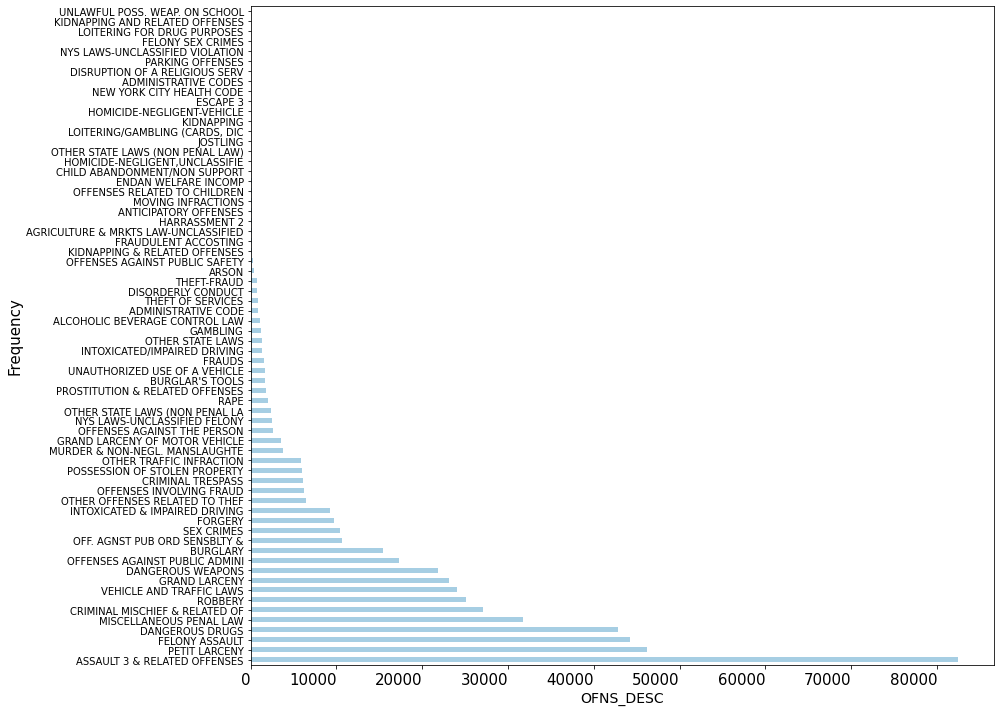

In [ ]:
from matplotlib.offsetbox import AnchoredText

def plot_bar(c, x, y, annot=False, text='', rot=None, kind='bar', sort=False, name=None):   #function to plot bar graphs
    ax = df[c].value_counts(sort=sort).plot(kind=kind, figsize=(x,y), colormap='Paired')
    ax.set_xlabel(name, size=14)
    ax.set_ylabel("Frequency",size=15)
    plt.xticks(rotation=rot, ha='right', size=15)
    plt.xticks(size=15)
    if annot is True:
        at = AnchoredText(
                text, prop=dict(size=10), frameon=True, loc='upper right')
        at.patch.set_boxstyle("round,pad=0.,rounding_size=0.1")
        ax.add_artist(at)
    plt.tight_layout()
    plt.savefig(c, facecolor='white')
    plt.show()

plot_bar('JURISDICTION_CODE', 14, 6, 90, name='JURISDICTION_CODE')
plot_bar('OFNS_DESC', 14, 10, 90, kind='barh', sort=True, name='OFNS_DESC')

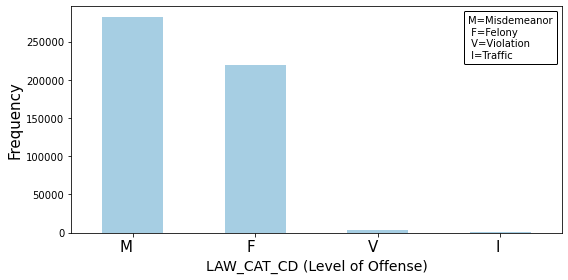

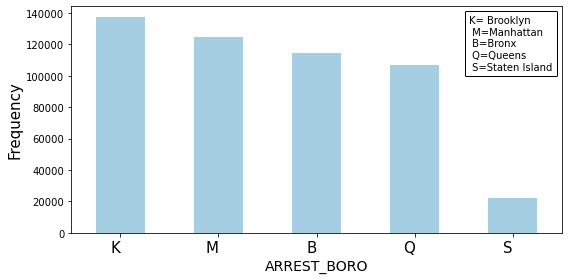

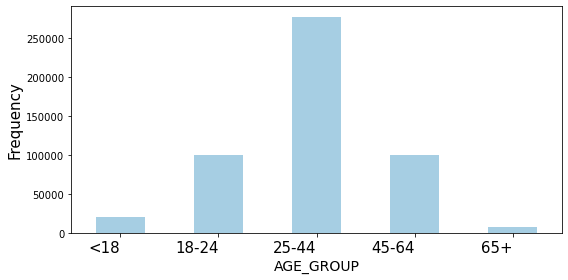

In [ ]:
label = "M=Misdemeanor\n F=Felony\n V=Violation\n I=Traffic"
plot_bar('LAW_CAT_CD', 8, 4, text=label, annot=True, sort=True, name='LAW_CAT_CD (Level of Offense)')

label = "K= Brooklyn\n M=Manhattan\n B=Bronx\n Q=Queens\n S=Staten Island"
plot_bar('ARREST_BORO', 8, 4,  text=label, annot=True, sort=True, name='ARREST_BORO')

# Make age ordered categorical variable
age_labels = ['<18', '18-24', '25-44', '45-64', '65+']
df['AGE_GROUP'] = pd.Categorical(df['AGE_GROUP'], categories = age_labels, ordered = True)
plot_bar('AGE_GROUP', 8, 4,  name='AGE_GROUP')

In [ ]:
df_gender = pd.DataFrame(df['PERP_SEX'].value_counts()).reset_index()
df_gender['Percentage'] = (df_gender['PERP_SEX'] / len(df))*100
df_gender.rename(columns = {'index':'Gender', 'PERP_SEX':'Total'}, inplace = True)
df_gender = df_gender.sort_values('Total', ascending = False).reset_index(drop = True)

# Show the data
df_gender

,Gender,Total,Percentage
0,M,416716,82.429877
1,F,88824,17.570123


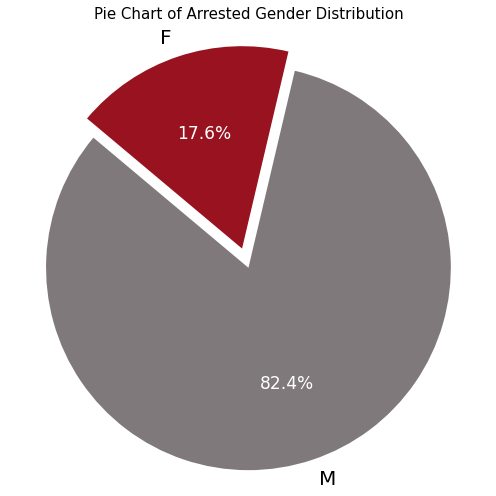

In [ ]:
# Customize colors and other settings
plt.subplots(figsize=(7,7))
colors = ['#80797c', '#981220']
explode = (0.1,0) # Explode 1st slice
# Create a pie chart
_, _, autotexts = plt.pie(df_gender['Total'], explode = explode, labels = df_gender['Gender'], 
                          textprops={'fontsize': 20}, colors = colors,
                          autopct = '%1.1f%%', shadow = False, startangle = 140)
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_size(17)

\
# Add title
plt.title('Pie Chart of Arrested Gender Distribution', size=15)
plt.axis('equal')
plt.tight_layout()
plt.savefig('Gender.png')
plt.show()

In [ ]:
# The composition of PERP_RACE
df_ethnicity = pd.DataFrame(df['PERP_RACE'].value_counts()).reset_index()
mapper = {'UNKNOWN':'OTHERS', 'AMERICAN INDIAN/ALASKAN NATIVE': 'OTHERS'}
df_ethnicity['index'] = df_ethnicity['index'].replace(mapper)
df_ethnicity.loc[len(df_ethnicity.index)] =(df_ethnicity.loc[[5,6]].sum())
df_ethnicity.drop([5, 6], inplace=True)
remap = {'OTHERSOTHERS':'OTHERS'}
df_ethnicity['index'] = df_ethnicity['index'].replace(remap)

df_ethnicity['Percentage'] = (df_ethnicity['PERP_RACE'] / len(df) )*100
df_ethnicity.rename(columns = {'index':'Ethnicity', 'PERP_RACE':'Total'}, inplace = True)
df_ethnicity = df_ethnicity.sort_values('Total', ascending = False).reset_index(drop = True)

# Show the data
df_ethnicity

,Ethnicity,Total,Percentage
0,BLACK,246923,48.843415
1,WHITE HISPANIC,125182,24.762037
2,WHITE,57719,11.417296
3,BLACK HISPANIC,43839,8.671717
4,ASIAN / PACIFIC ISLANDER,27866,5.512126
5,OTHERS,4011,0.793409


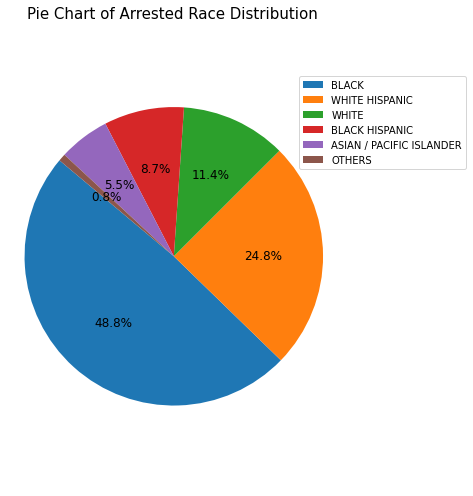

In [ ]:
# Create a pie chart
plt.subplots(figsize=(7,7))
_, _, autotexts = plt.pie(df_ethnicity['Total'], autopct = '%1.1f%%', shadow = False, startangle = 140)
for autotext in autotexts:
    autotext.set_size(12)
# Add title
plt.title('Pie Chart of Arrested Race Distribution', size=15)
plt.legend(labels = df_ethnicity['Ethnicity'], bbox_to_anchor=(1.4, 0.9), loc="upper right")
plt.axis('equal')
plt.tight_layout()
plt.savefig('race.png')
plt.show()

In [ ]:
locate = df.groupby(['Latitude','Longitude']).size()
locate[0:5]

Latitude   Longitude 
40.498905  -74.241537    1
40.498957  -74.244367    1
40.499401  -74.242175    1
40.499850  -74.239918    2
40.499948  -74.238006    1
dtype: int64

In [ ]:
import plotly.express as px
fig = px.density_mapbox(locate, lat=locate.index.get_level_values(0), lon=locate.index.get_level_values(1), z=locate.values,
                        mapbox_style="stamen-terrain")
 
fig

# Heirarchical clustering (Unsupervised)

In [ ]:
df_hclust = df.head(1000) # selecting only a few rows since the dataset is too large
df_hclust.columns

Index(['ARREST_KEY', 'ARREST_DATE', 'OFNS_DESC', 'LAW_CAT_CD', 'ARREST_BORO',
       'JURISDICTION_CODE', 'AGE_GROUP', 'PERP_SEX', 'PERP_RACE', 'Latitude',
       'Longitude'],
      dtype='object')

In [ ]:
obj_df = df_hclust.drop(axis=1, columns=['ARREST_KEY', 'ARREST_DATE',
                                         'JURISDICTION_CODE','Latitude','Longitude'])
obj_df.head()

,OFNS_DESC,LAW_CAT_CD,ARREST_BORO,AGE_GROUP,PERP_SEX,PERP_RACE
1,RAPE,F,B,25-44,M,WHITE HISPANIC
2,SEX CRIMES,M,Q,25-44,M,BLACK
3,SEX CRIMES,F,M,45-64,M,BLACK
6,ARSON,F,B,25-44,M,WHITE HISPANIC
7,FORGERY,F,Q,18-24,M,BLACK


In [ ]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

label_encoded_df = obj_df.copy()

for col in label_encoded_df.drop(axis=1, columns=['AGE_GROUP']).columns:
    if col != 'AGE_GROUP':
        label_encoded_df[col]=le.fit_transform(label_encoded_df[col])

label_encoded_df.replace({'AGE_GROUP': {'<18':0, '18-24':1, '25-44':2, '45-64':3, '65+':4 }}, inplace=True)
label_encoded_df

,OFNS_DESC,LAW_CAT_CD,ARREST_BORO,AGE_GROUP,PERP_SEX,PERP_RACE
1,34,0,0,2,1,6
2,36,2,3,2,1,2
3,36,0,2,3,1,2
6,2,0,0,2,1,6
7,13,0,3,1,1,2
...,...,...,...,...,...,...
1180,10,0,1,1,1,2
1181,32,0,2,2,1,6
1182,3,2,3,2,0,6
1183,8,2,1,1,0,2


In [ ]:
#Standardizing OFNS_DESC Code so that it doesnot create undue clustering because the other variales are in single digit number but offense description has 50 hence, we standardize. So there is no added weightage.
label_encoded_df['OFNS_DESC'] = (label_encoded_df['OFNS_DESC'] - label_encoded_df['OFNS_DESC'].mean()) / label_encoded_df['OFNS_DESC'].std()
df_std = label_encoded_df
df_std

,OFNS_DESC,LAW_CAT_CD,ARREST_BORO,AGE_GROUP,PERP_SEX,PERP_RACE
1,1.077943,0,0,2,1,6
2,1.234020,2,3,2,1,2
3,1.234020,0,2,3,1,2
6,-1.419283,0,0,2,1,6
7,-0.560861,0,3,1,1,2
...,...,...,...,...,...,...
1180,-0.794976,0,1,1,1,2
1181,0.921866,0,2,2,1,6
1182,-1.341244,2,3,2,0,6
1183,-0.951053,2,1,1,0,2


In [ ]:
g_matrix = df_std.to_numpy()
g_matrix

array([[ 1.07794309,  0.        ,  0.        ,  2.        ,  1.        ,
         6.        ],
       [ 1.2340197 ,  2.        ,  3.        ,  2.        ,  1.        ,
         2.        ],
       [ 1.2340197 ,  0.        ,  2.        ,  3.        ,  1.        ,
         2.        ],
       ...,
       [-1.34124433,  2.        ,  3.        ,  2.        ,  0.        ,
         6.        ],
       [-0.95105281,  2.        ,  1.        ,  1.        ,  0.        ,
         2.        ],
       [-0.32674638,  0.        ,  2.        ,  2.        ,  1.        ,
         5.        ]])

In [ ]:
from collections import defaultdict
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram
from matplotlib.colors import rgb2hex, colorConverter
from scipy.cluster.hierarchy import set_link_color_palette

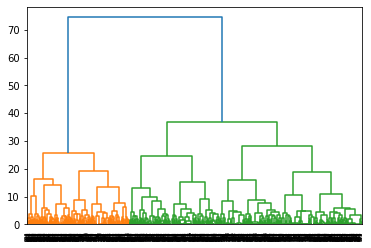

In [ ]:
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
dendrogram = sch.dendrogram(sch.linkage(g_matrix, method = 'ward'))

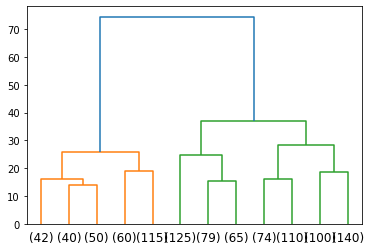

In [ ]:
# Unable to read above dendogram. See hierarchial clustering for last 12 clusters
dendrogram1 = sch.dendrogram(sch.linkage(g_matrix, method = 'ward'), truncate_mode = 'lastp', p=12)

In [ ]:
from sklearn.cluster import AgglomerativeClustering
cluster_model = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'ward')

In [ ]:
y_hc = cluster_model.fit_predict(g_matrix)
y_hc

array([1, 2, 0, 1, 0, 2, 0, 2, 0, 1, 2, 0, 0, 0, 2, 2, 2, 2, 0, 2, 0, 1,
       1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 2, 1, 1, 0, 0, 0,
       1, 0, 0, 1, 1, 0, 0, 0, 2, 1, 1, 0, 0, 0, 1, 1, 2, 0, 1, 0, 1, 1,
       0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 1, 1, 2, 0, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 1, 2, 0, 2, 0, 0, 2, 0, 1, 1, 0, 0, 0, 1, 2, 0, 1, 0,
       2, 0, 1, 0, 0, 1, 2, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 2, 0, 0,
       0, 1, 2, 0, 2, 2, 1, 2, 0, 1, 0, 0, 1, 0, 0, 0, 2, 1, 1, 1, 0, 0,
       1, 2, 1, 1, 0, 2, 2, 2, 0, 2, 2, 1, 0, 1, 1, 0, 1, 0, 0, 1, 2, 0,
       0, 0, 0, 0, 0, 0, 1, 2, 0, 1, 2, 0, 2, 0, 0, 0, 0, 0, 2, 0, 1, 0,
       0, 2, 0, 1, 0, 0, 1, 0, 2, 0, 2, 0, 0, 0, 0, 1, 2, 1, 2, 0, 1, 0,
       2, 0, 0, 1, 1, 0, 1, 1, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 1, 0, 2, 0,
       2, 2, 1, 2, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 2, 2, 0, 2, 0, 1, 0,
       0, 0, 0, 0, 0, 2, 0, 0, 1, 1, 0, 0, 0, 1, 2, 0, 0, 2, 0, 1, 2, 1,
       0, 1, 1, 2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,

Visualize Clustering

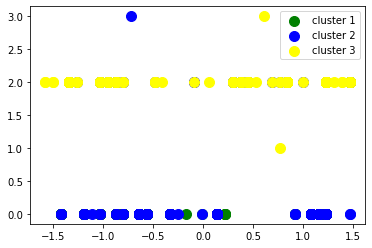

In [ ]:
plt.scatter(g_matrix[y_hc == 0,0], g_matrix[y_hc == 0,1], s = 100, c = 'green', label = "cluster 1")
plt.scatter(g_matrix[y_hc == 1,0], g_matrix[y_hc == 1,1], s = 100, c = 'blue', label = 'cluster 2')
plt.scatter(g_matrix[y_hc == 2,0], g_matrix[y_hc == 2,1], s = 100, c = 'yellow', label = 'cluster 3')
plt.legend()
plt.show()

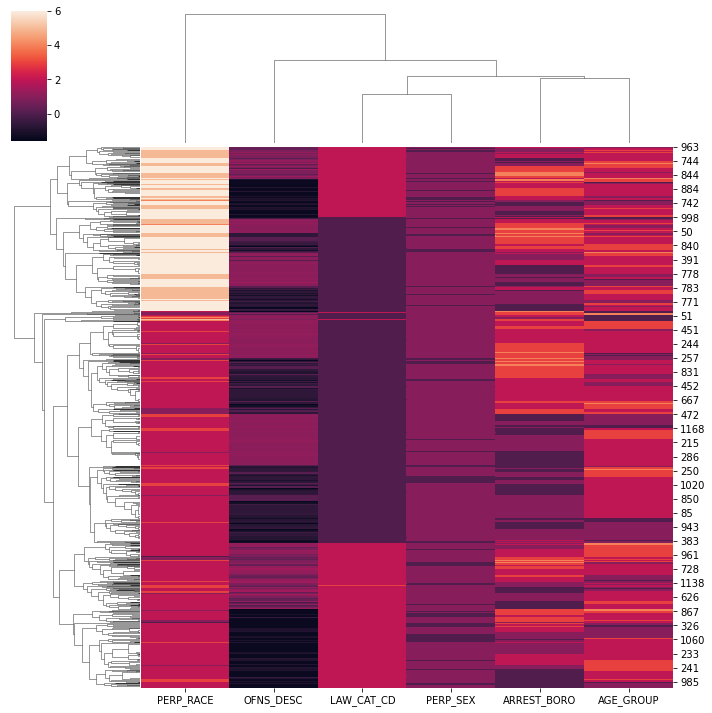

In [ ]:
cg = sns.clustermap(df_std)
plt.show()

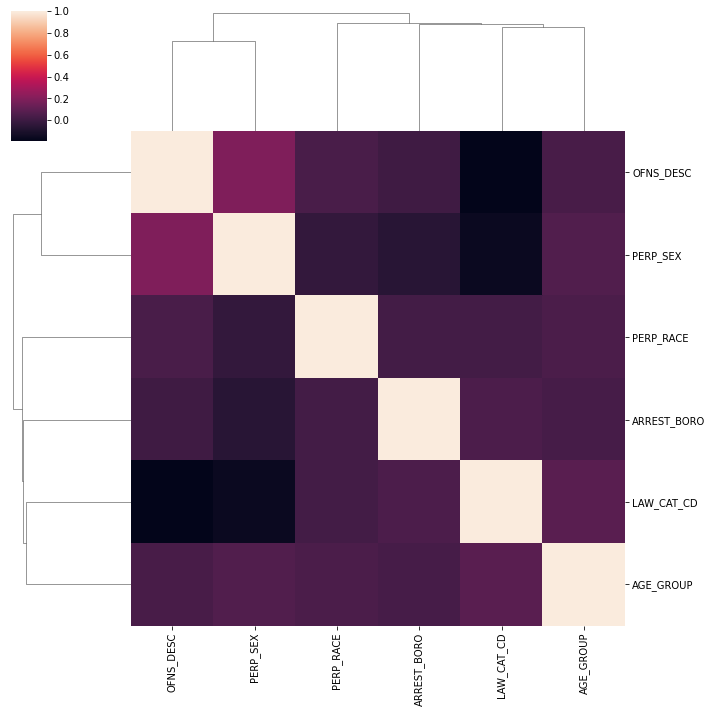

In [ ]:
cg = sns.clustermap(df_std.corr())
plt.show()

In [ ]:
df_std['pred'] = y_hc
df_std

,OFNS_DESC,LAW_CAT_CD,ARREST_BORO,AGE_GROUP,PERP_SEX,PERP_RACE,pred
1,1.077943,0,0,2,1,6,1
2,1.234020,2,3,2,1,2,2
3,1.234020,0,2,3,1,2,0
6,-1.419283,0,0,2,1,6,1
7,-0.560861,0,3,1,1,2,0
...,...,...,...,...,...,...,...
1180,-0.794976,0,1,1,1,2,0
1181,0.921866,0,2,2,1,6,1
1182,-1.341244,2,3,2,0,6,1
1183,-0.951053,2,1,1,0,2,2


In [ ]:
df_hclust['pred'] = y_hc
df_hclust.drop(axis=1,  columns=['ARREST_KEY', 'ARREST_DATE',
                                'JURISDICTION_CODE','Latitude','Longitude'])

,OFNS_DESC,LAW_CAT_CD,ARREST_BORO,AGE_GROUP,PERP_SEX,PERP_RACE,pred
1,RAPE,F,B,25-44,M,WHITE HISPANIC,1
2,SEX CRIMES,M,Q,25-44,M,BLACK,2
3,SEX CRIMES,F,M,45-64,M,BLACK,0
6,ARSON,F,B,25-44,M,WHITE HISPANIC,1
7,FORGERY,F,Q,18-24,M,BLACK,0
...,...,...,...,...,...,...,...
1180,DANGEROUS WEAPONS,F,K,18-24,M,BLACK,0
1181,POSSESSION OF STOLEN PROPERTY,F,M,25-44,M,WHITE HISPANIC,1
1182,ASSAULT 3 & RELATED OFFENSES,M,Q,25-44,F,WHITE HISPANIC,1
1183,CRIMINAL TRESPASS,M,K,18-24,F,BLACK,2


# K-modes clustering (unsupervised)

In [ ]:
#!pip install kmodes
from kmodes.kmodes import KModes #KModes Clustering Algorithm for Categorical data similar

In [ ]:
#!pip install plotnine
# Import module for data visualization
# Use the theme of ggplot
plt.style.use('ggplot')

In [ ]:
# Selecting only the categorical data columns
cols = df.select_dtypes('category').columns
df_cat = df[cols]

df_cat.head()

,OFNS_DESC,LAW_CAT_CD,ARREST_BORO,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE
1,RAPE,F,B,0,25-44,M,WHITE HISPANIC
2,SEX CRIMES,M,Q,0,25-44,M,BLACK
3,SEX CRIMES,F,M,0,45-64,M,BLACK
6,ARSON,F,B,72,25-44,M,WHITE HISPANIC
7,FORGERY,F,Q,0,18-24,M,BLACK


In [ ]:
#more cleaning for kmode clustering
clean_df_cat2=df_cat.drop(["JURISDICTION_CODE"], axis = 1) 
clean_df_cat2.head()

,OFNS_DESC,LAW_CAT_CD,ARREST_BORO,AGE_GROUP,PERP_SEX,PERP_RACE
1,RAPE,F,B,25-44,M,WHITE HISPANIC
2,SEX CRIMES,M,Q,25-44,M,BLACK
3,SEX CRIMES,F,M,45-64,M,BLACK
6,ARSON,F,B,25-44,M,WHITE HISPANIC
7,FORGERY,F,Q,18-24,M,BLACK


In [ ]:
#converting dataframe to matrix
dfMatrix = clean_df_cat2.loc[:, clean_df_cat2.columns].to_numpy()
dfMatrix

array([['RAPE', 'F', 'B', '25-44', 'M', 'WHITE HISPANIC'],
       ['SEX CRIMES', 'M', 'Q', '25-44', 'M', 'BLACK'],
       ['SEX CRIMES', 'F', 'M', '45-64', 'M', 'BLACK'],
       ...,
       ['MISCELLANEOUS PENAL LAW', 'F', 'M', '25-44', 'M',
        'BLACK HISPANIC'],
       ['FELONY ASSAULT', 'F', 'B', '25-44', 'M', 'BLACK HISPANIC'],
       ['OFFENSES INVOLVING FRAUD', 'M', 'K', '25-44', 'M', 'BLACK']],
      dtype=object)

In [ ]:
#choosing optimal K
cost = []
for cluster in range(1, 10):
    try:
        kmodes = KModes(n_jobs = -1, n_clusters = cluster, init = 'Huang', random_state = 0, verbose=1)
        kmodes.fit_predict(dfMatrix)
        cost.append(kmodes.cost_)
        print('iteration #: {}'.format(cluster))
    except: 
        break

Best run was number 1
iteration #: 1
Best run was number 1
iteration #: 2
Best run was number 4
iteration #: 3
Best run was number 2
iteration #: 4
Best run was number 4
iteration #: 5
Best run was number 4
iteration #: 6
Best run was number 2
iteration #: 7
Best run was number 5
iteration #: 8
Best run was number 8
iteration #: 9


In [ ]:
#converting the results into a dataframe
df_cost = pd.DataFrame({'Cluster': range(1, 10), 'Cost': cost})
df_cost

,Cluster,Cost
0,1,1590700.0
1,2,1343437.0
2,3,1225104.0
3,4,1162981.0
4,5,1119123.0
5,6,1053027.0
6,7,1039768.0
7,8,1009956.0
8,9,1006103.0


In [ ]:
import plotnine

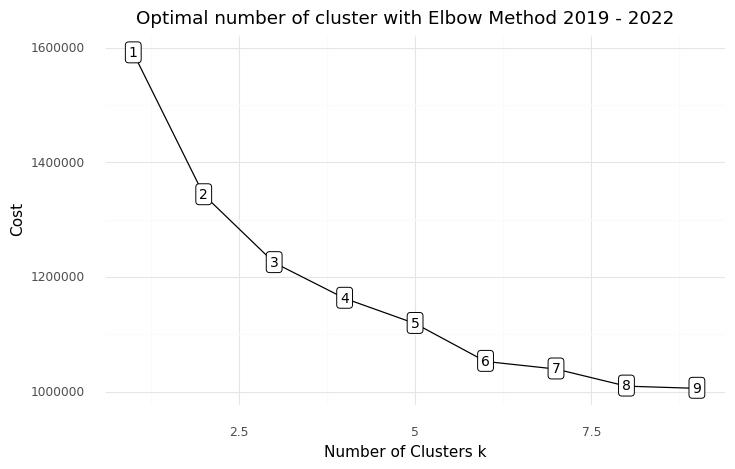

<ggplot: (154554695696)>

In [ ]:
#plotting the cost versus the number of cluster or in this case iterations to find the optimal k
#where the elbow like bend takes place is the optimal number of clusters
plotnine.options.figure_size = (8, 4.8)
(
    ggplot(data = df_cost)+
    geom_line(aes(x = 'Cluster',
                  y = 'Cost'))+
    geom_point(aes(x = 'Cluster',
                   y = 'Cost'))+
    geom_label(aes(x = 'Cluster',
                   y = 'Cost',
                   label = 'Cluster'),
               size = 10,
               nudge_y = 1000) +
    labs(title = 'Optimal number of cluster with Elbow Method 2019 - 2022')+
    xlab('Number of Clusters k')+
    ylab('Cost')+
    theme_minimal()
)

In [ ]:
#fiting the clusters
kmodes = KModes(n_jobs = -1, n_clusters = 3, init = 'Huang', random_state = 0)
kmodes.fit_predict(dfMatrix)

array([0, 1, 0, ..., 0, 0, 0], dtype=uint16)

In [ ]:
#clusters centroids
kmodes.cluster_centroids_

array([['FELONY ASSAULT', 'F', 'K', '25-44', 'M', 'BLACK'],
       ['ASSAULT 3 & RELATED OFFENSES', 'M', 'M', '25-44', 'M', 'BLACK'],
       ['ASSAULT 3 & RELATED OFFENSES', 'M', 'B', '45-64', 'M',
        'WHITE HISPANIC']], dtype='<U28')

In [ ]:
#cost
kmodes.cost_

1225104.0

In [ ]:
#adding the clusters to the dataframe
clean_df_cat2['Cluster Labels'] = kmodes.labels_
clean_df_cat2['Segment'] = clean_df_cat2['Cluster Labels'].map({0:'First', 1:'Second', 2:'Third'})
clean_df_cat2.head()

,OFNS_DESC,LAW_CAT_CD,ARREST_BORO,AGE_GROUP,PERP_SEX,PERP_RACE,Cluster Labels,Segment
1,RAPE,F,B,25-44,M,WHITE HISPANIC,0,First
2,SEX CRIMES,M,Q,25-44,M,BLACK,1,Second
3,SEX CRIMES,F,M,45-64,M,BLACK,0,First
6,ARSON,F,B,25-44,M,WHITE HISPANIC,0,First
7,FORGERY,F,Q,18-24,M,BLACK,0,First


In [ ]:
clean_df_cat2['Segment'] = clean_df_cat2['Segment'].astype('category')
clean_df_cat2['Segment'] = clean_df_cat2['Segment'].cat.reorder_categories(['First', 'Second', 'Third'])
clean_df_cat2.head()

,OFNS_DESC,LAW_CAT_CD,ARREST_BORO,AGE_GROUP,PERP_SEX,PERP_RACE,Cluster Labels,Segment
1,RAPE,F,B,25-44,M,WHITE HISPANIC,0,First
2,SEX CRIMES,M,Q,25-44,M,BLACK,1,Second
3,SEX CRIMES,F,M,45-64,M,BLACK,0,First
6,ARSON,F,B,25-44,M,WHITE HISPANIC,0,First
7,FORGERY,F,Q,18-24,M,BLACK,0,First


In [ ]:
#columns for centroids
list_col = ['Cluster Labels', 'Segment']
cols = [col for col in clean_df_cat2 if col not in list_col]
cols

['OFNS_DESC',
 'LAW_CAT_CD',
 'ARREST_BORO',
 'AGE_GROUP',
 'PERP_SEX',
 'PERP_RACE']

In [ ]:
index = ['First Cluster', 'Second Cluster', 'Third Cluster']
pd.DataFrame(kmodes.cluster_centroids_, columns = cols, index = index)

,OFNS_DESC,LAW_CAT_CD,ARREST_BORO,AGE_GROUP,PERP_SEX,PERP_RACE
First Cluster,FELONY ASSAULT,F,K,25-44,M,BLACK
Second Cluster,ASSAULT 3 & RELATED OFFENSES,M,M,25-44,M,BLACK
Third Cluster,ASSAULT 3 & RELATED OFFENSES,M,B,45-64,M,WHITE HISPANIC


# Supervised classification

Response variable is : LAW_CAT_CD

In [ ]:
data = df.copy()
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 505540 entries, 1 to 511440
Data columns (total 11 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   ARREST_KEY         505540 non-null  int64         
 1   ARREST_DATE        505540 non-null  datetime64[ns]
 2   OFNS_DESC          505540 non-null  category      
 3   LAW_CAT_CD         505540 non-null  category      
 4   ARREST_BORO        505540 non-null  category      
 5   JURISDICTION_CODE  505540 non-null  category      
 6   AGE_GROUP          505540 non-null  category      
 7   PERP_SEX           505540 non-null  category      
 8   PERP_RACE          505540 non-null  category      
 9   Latitude           505540 non-null  float64       
 10  Longitude          505540 non-null  float64       
dtypes: category(7), datetime64[ns](1), float64(2), int64(1)
memory usage: 22.7 MB


In [ ]:
data.drop(axis=1, 
          columns=['ARREST_KEY', 'ARREST_DATE', 'JURISDICTION_CODE', 'OFNS_DESC'],
          inplace=True)
data.head()

,LAW_CAT_CD,ARREST_BORO,AGE_GROUP,PERP_SEX,PERP_RACE,Latitude,Longitude
1,F,B,25-44,M,WHITE HISPANIC,40.816392,-73.895296
2,M,Q,25-44,M,BLACK,40.679700,-73.776047
3,F,M,45-64,M,BLACK,40.800694,-73.941109
6,F,B,25-44,M,WHITE HISPANIC,40.804013,-73.878332
7,F,Q,18-24,M,BLACK,40.691660,-73.779199


In [ ]:
mapper = {'25-44':2, '18-24':1, '45-64':3, '<18':0, '65+':4}
data['AGE_GROUP'] = data['AGE_GROUP'].replace(mapper)
df_encod = pd.get_dummies(data, columns=['ARREST_BORO', 'PERP_SEX', 'PERP_RACE'])
df_encod

,LAW_CAT_CD,AGE_GROUP,Latitude,Longitude,ARREST_BORO_B,ARREST_BORO_K,ARREST_BORO_M,ARREST_BORO_Q,ARREST_BORO_S,PERP_SEX_F,PERP_SEX_M,PERP_RACE_AMERICAN INDIAN/ALASKAN NATIVE,PERP_RACE_ASIAN / PACIFIC ISLANDER,PERP_RACE_BLACK,PERP_RACE_BLACK HISPANIC,PERP_RACE_UNKNOWN,PERP_RACE_WHITE,PERP_RACE_WHITE HISPANIC
1,F,2,40.816392,-73.895296,1,0,0,0,0,0,1,0,0,0,0,0,0,1
2,M,2,40.679700,-73.776047,0,0,0,1,0,0,1,0,0,1,0,0,0,0
3,F,3,40.800694,-73.941109,0,0,1,0,0,0,1,0,0,1,0,0,0,0
6,F,2,40.804013,-73.878332,1,0,0,0,0,0,1,0,0,0,0,0,0,1
7,F,1,40.691660,-73.779199,0,0,0,1,0,0,1,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
511436,F,2,40.664416,-73.891022,0,1,0,0,0,0,1,0,0,0,0,0,0,1
511437,F,2,40.656619,-73.930903,0,1,0,0,0,0,1,0,0,1,0,0,0,0
511438,F,2,40.765397,-73.985702,0,0,1,0,0,0,1,0,0,0,1,0,0,0
511439,F,2,40.823387,-73.870170,1,0,0,0,0,0,1,0,0,0,1,0,0,0


In [ ]:
x = df_encod.drop(axis=1, columns=['LAW_CAT_CD'])
y = df_encod['LAW_CAT_CD']
x_train, x_test, y_train, y_test = train_test_split(x, y, random_state = 42,test_size=0.20)

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(404432, 17)
(404432,)
(101108, 17)
(101108,)


In [ ]:
x_train.head()

,AGE_GROUP,Latitude,Longitude,ARREST_BORO_B,ARREST_BORO_K,ARREST_BORO_M,ARREST_BORO_Q,ARREST_BORO_S,PERP_SEX_F,PERP_SEX_M,PERP_RACE_AMERICAN INDIAN/ALASKAN NATIVE,PERP_RACE_ASIAN / PACIFIC ISLANDER,PERP_RACE_BLACK,PERP_RACE_BLACK HISPANIC,PERP_RACE_UNKNOWN,PERP_RACE_WHITE,PERP_RACE_WHITE HISPANIC
132050,1,40.681065,-74.008554,0,1,0,0,0,0,1,0,0,1,0,0,0,0
373728,3,40.784507,-73.975483,0,0,1,0,0,0,1,0,0,1,0,0,0,0
359826,1,40.821805,-73.943457,0,0,1,0,0,0,1,0,0,1,0,0,0,0
298942,0,40.875530,-73.829056,1,0,0,0,0,1,0,0,0,1,0,0,0,0
10760,1,40.819886,-73.901227,1,0,0,0,0,0,1,0,0,0,0,0,0,1


In [ ]:
y_train.head()

132050    M
373728    F
359826    M
298942    M
10760     M
Name: LAW_CAT_CD, dtype: category
Categories (4, object): ['F', 'I', 'M', 'V']

### Logistic Regression

In [ ]:
lr = LogisticRegression(random_state = 42, max_iter=1000, class_weight='balanced',multi_class='multinomial')
lr.fit(x_train, y_train)
y_pred = lr.predict(x_test) 
y_pred

array(['I', 'V', 'F', ..., 'F', 'M', 'I'], dtype=object)

In [ ]:
print('classes: ',lr.classes_)
print('intercept :', lr.intercept_)
print('coefficient: ',lr.coef_)  

classes:  ['F' 'I' 'M' 'V']
intercept : [ 0.01370863  0.01183857 -0.00787345 -0.01767375]
coefficient:  [[-0.18950425  1.13524135  0.62011192  0.03455245 -0.17210813 -0.28353393
  -0.21798852  0.65276355  0.01967705 -0.00599163  0.07743348  0.15978197
   0.30094706  0.19180631 -0.63236944 -0.14010704  0.05619308]
 [ 0.1298038   0.39183264  0.21842995 -0.44644961  0.11287673 -0.09474347
   0.29239881  0.14773132 -0.12095339  0.13276716 -0.18235701  0.1809181
  -0.34716991 -0.02819598  0.56474127 -0.15518496 -0.02093774]
 [ 0.03157321  0.9078124   0.49584804  0.2141628  -0.39260007 -0.22329104
  -0.20051133  0.5943852   0.16303121 -0.17088566  0.34974287  0.09334546
  -0.0178849  -0.0358473  -0.14668906 -0.19128461 -0.05923692]
 [ 0.02812723 -2.43488639 -1.3343899   0.19773436  0.45183148  0.60156844
   0.12610105 -1.39488006 -0.06175486  0.04411013 -0.24481933 -0.43404553
   0.06410775 -0.12776303  0.21431723  0.48657661  0.02398157]]


In [ ]:
cm =confusion_matrix(y_test,y_pred)
cm

array([[10373, 10163,  9899, 13343],
       [   17,    63,    25,    69],
       [ 9714, 13773, 16392, 16537],
       [  103,   148,    64,   425]], dtype=int64)

In [ ]:
# Compute logistic regression model scores
lr_precision = precision_score(y_test,y_pred,average='weighted')
lr_recall = recall_score(y_test,y_pred,average='weighted')
lr_f1 = f1_score(y_test,y_pred,average='weighted')

In [ ]:
print("Logistic regression Scores")
print('---------------------------------')
print('Recall: {:.2f} '.format(lr_recall))
print('Precision: {:.2f}'.format(lr_precision))
print('F1 Score: {:.2f}'.format(lr_f1))
print('Accuracy Score: {:.2f}'.format(accuracy_score(y_pred, y_test)))


Logistic regression Scores
---------------------------------
Recall: 0.27 
Precision: 0.57
F1 Score: 0.36
Accuracy Score: 0.27


In [ ]:
#  Confusion Matrix  
def plot_confusionmatrix(y_true, y_pred, cm, model_name):
    fig, ax = plt.subplots(figsize=(10, 8)) 
    ax = sns.heatmap(
      cm, 
      annot=True, 
      fmt="d", 
      cmap="Blues",
      ax=ax,
      annot_kws={"size":22}
    )
    plt.ylabel('Actual', fontsize=18)
    plt.xlabel('Predicted', fontsize=18)
    ax.set_xticklabels(['F', 'I', 'M', 'V'])
    ax.set_yticklabels(['F', 'I', 'M', 'V'])
    plt.suptitle(model_name, fontsize=20, y=0.9, x=0.45)  
    b, t = plt.ylim()
    b += 0.5 
    t -= 0.5 
    plt.ylim(b, t)
    plt.show()

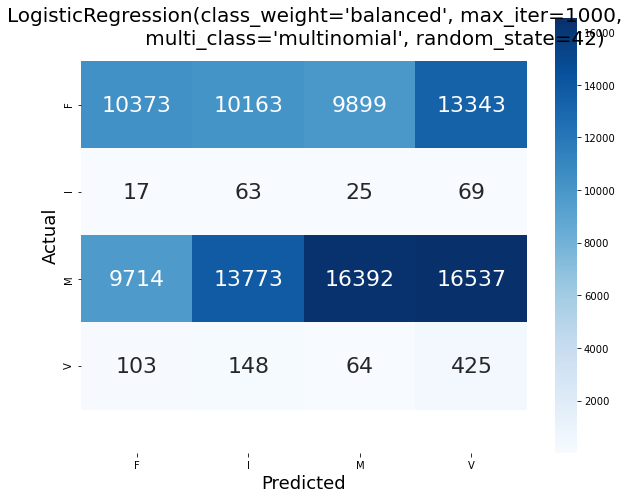

In [ ]:
plot_confusionmatrix(y_test, y_pred, cm, lr)

### Random Forest

In [ ]:
# The following code trains a DecisionTreeClassifier on the dataset
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

randomF_clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
randomF_clf.fit(x_train, y_train)

RandomForestClassifier(class_weight='balanced', random_state=42)

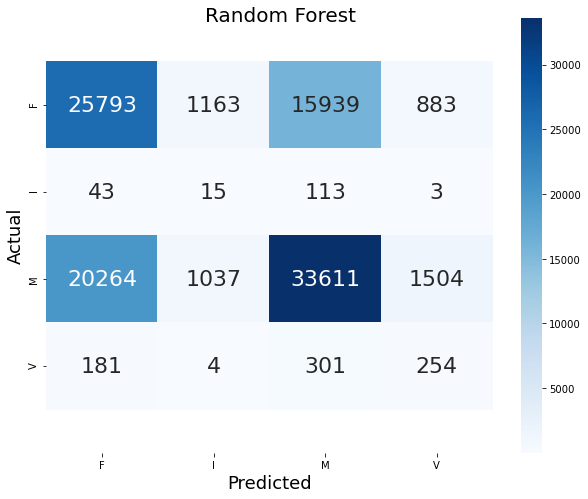

In [ ]:
# Predicting classes
randomF_pred = randomF_clf.predict(x_test)
cm2 =confusion_matrix(y_test,randomF_pred)
plot_confusionmatrix(y_test, randomF_pred, cm2, "Random Forest")

In [ ]:
rf_precision = precision_score(y_test,randomF_pred,average='weighted')
rf_recall = recall_score(y_test,randomF_pred,average='weighted')
rf_f1 = f1_score(y_test, randomF_pred,average='weighted')

In [ ]:
print("Random Forest Scores")
print('---------------------------------')
print('Recall: {:.2f}'.format(rf_recall))
print('Precision: {:.2f} '.format(rf_precision))
print('F1 Score: {:.2f} '.format(rf_f1))
print('Accuracy Score: {:.2f}'.format(accuracy_score(randomF_pred, y_test)))

Random Forest Scores
---------------------------------
Recall: 0.59
Precision: 0.62 
F1 Score: 0.60 
Accuracy Score: 0.59


### Bagging

In [ ]:
#Bagging
# Bagging
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from imblearn.ensemble import BalancedBaggingClassifier

bag_clf = BalancedBaggingClassifier(
    DecisionTreeClassifier(random_state=42, class_weight='balanced'), n_estimators=500,
    max_samples=100, bootstrap=True, random_state=42 )
bag_clf.fit(x_train, y_train)

BalancedBaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                                random_state=42),
                          max_samples=100, n_estimators=500, random_state=42)

In [ ]:
bag_pred = bag_clf.predict(x_test)

In [ ]:
bag_precision = precision_score(y_test,bag_pred,average='weighted')
bag_recall = recall_score(y_test,bag_pred,average='weighted')
bag_f1 = f1_score(y_test,bag_pred,average='weighted')

In [ ]:
print("Bagging Scores")
print('---------------------------------')
print('Recall: {:.2f}'.format(bag_recall))
print('Precision: {:.2f} '.format(bag_precision))
print('F1 Score: {:.2f} '.format(bag_f1))
print('Accuracy Score: {:.2f}'.format(accuracy_score(bag_pred, y_test)))

Bagging Scores
---------------------------------
Recall: 0.56
Precision: 0.56 
F1 Score: 0.56 
Accuracy Score: 0.56


### SGD

In [ ]:
sgd_clf = SGDClassifier(max_iter=1000, random_state=42,class_weight='balanced')
sgd_clf.fit(x_train,y_train)
sgd_pred = sgd_clf.predict(x_test)

In [ ]:
sgd_precision = precision_score(y_test,sgd_pred,average='weighted')
sgd_recall = recall_score(y_test,sgd_pred,average='weighted')
sgd_f1 = f1_score(y_test,sgd_pred,average='weighted')

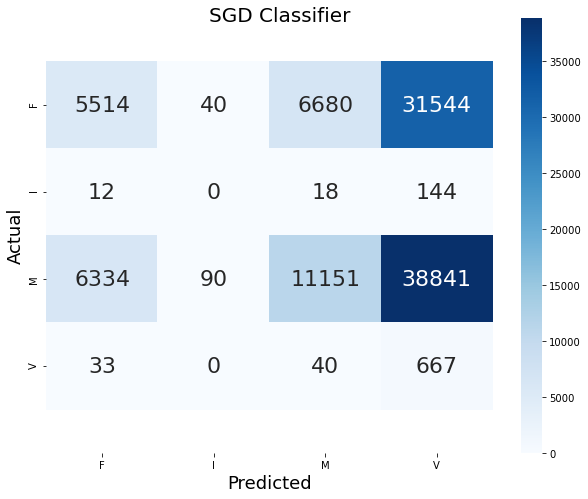

In [ ]:
cm4 =confusion_matrix(y_test,sgd_pred)
plot_confusionmatrix(y_test, sgd_pred, cm4, "SGD Classifier")

In [ ]:
print("SGD Scores")
print('---------------------------------')
print('Recall: {:.2f}'.format(sgd_recall))
print('Precision: {:.2f} '.format(sgd_precision))
print('F1 Score: {:.2f} '.format(sgd_f1))
print('Accuracy Score: {:.2f}'.format(accuracy_score(sgd_pred, y_test)))

SGD Scores
---------------------------------
Recall: 0.17
Precision: 0.55 
F1 Score: 0.25 
Accuracy Score: 0.17


### KNeighbors

In [ ]:
# pip install threadpoolctl==3.1.0

In [ ]:
kn_clf = KNeighborsClassifier()
kn_clf.fit(x_train,y_train)
kn_pred = kn_clf.predict(x_test)

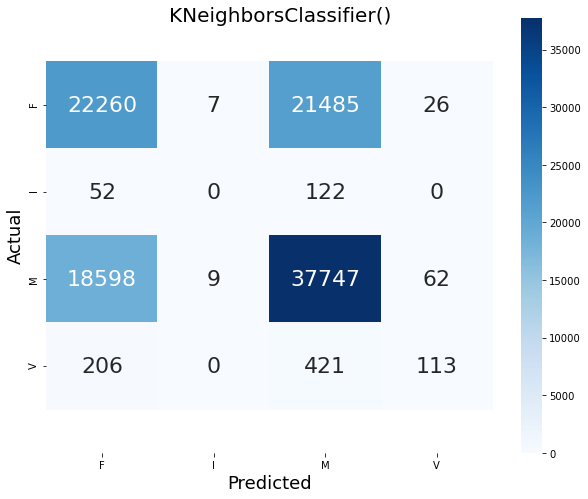

In [ ]:
cm5 = confusion_matrix(y_test,kn_pred)
plot_confusionmatrix(y_test, kn_pred, cm5, kn_clf)

In [ ]:
kn_precision = precision_score(y_test,kn_pred,average='weighted')
kn_recall = recall_score(y_test,kn_pred,average='weighted')
kn_f1 = f1_score(y_test,kn_pred,average='weighted')

In [ ]:
print("KNeighbors Scores")
print('---------------------------------')
print('Recall: {:.2f}'.format(kn_recall))
print('Precision: {:.2f} '.format(kn_precision))
print('F1 Score: {:.2f} '.format(kn_f1))
print('Accuracy Score: {:.2f}'.format(accuracy_score(kn_pred, y_test)))

KNeighbors Scores
---------------------------------
Recall: 0.59
Precision: 0.59 
F1 Score: 0.59 
Accuracy Score: 0.59


### Soft Voting

In [ ]:
voting_clf = VotingClassifier(
    estimators=[('lr', lr), ('rf', randomF_clf)],
    voting='soft') # Soft voting
voting_clf.fit(x_train, y_train)

VotingClassifier(estimators=[('lr',
                              LogisticRegression(class_weight='balanced',
                                                 max_iter=1000,
                                                 multi_class='multinomial',
                                                 random_state=42)),
                             ('rf',
                              RandomForestClassifier(class_weight='balanced',
                                                     random_state=42))],
                 voting='soft')

In [ ]:
voting_pred = voting_clf.predict(x_test)

In [ ]:
voting_precision = precision_score(y_test,voting_pred,average='weighted')
voting_recall = recall_score(y_test,voting_pred,average='weighted')
voting_f1 = f1_score(y_test,voting_pred,average='weighted')

In [ ]:
print("Soft Voting Scores")
print('---------------------------------')
print('Recall: {:.2f}'.format(voting_recall))
print('Precision: {:.2f} '.format(voting_precision))
print('F1 Score: {:.2f} '.format(voting_f1))
print('Accuracy Score: {:.2f}'.format(accuracy_score(voting_pred, y_test)))

Soft Voting Scores
---------------------------------
Recall: 0.59
Precision: 0.62 
F1 Score: 0.60 
Accuracy Score: 0.59


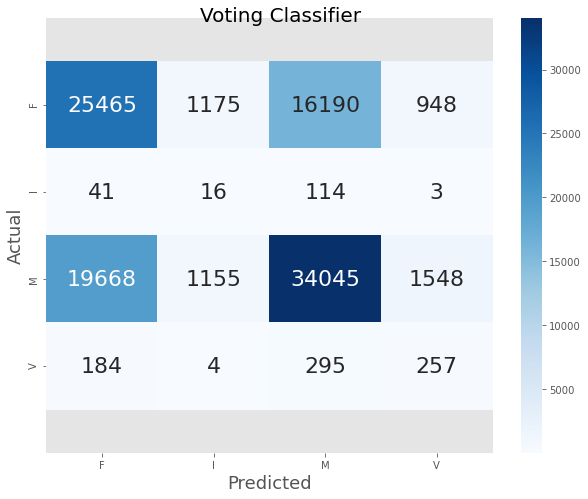

In [ ]:
cm6 = confusion_matrix(y_test,voting_pred)
plot_confusionmatrix(y_test, voting_pred, cm6, "Voting Classifier")

### Hard Voting

In [ ]:
hard_voting_clf = VotingClassifier(
    estimators=[('lr', lr), ('rf', randomF_clf)],
    voting='hard') # Soft voting
hard_voting_clf.fit(x_train, y_train)

VotingClassifier(estimators=[('lr',
                              LogisticRegression(class_weight='balanced',
                                                 max_iter=1000,
                                                 multi_class='multinomial',
                                                 random_state=42)),
                             ('rf',
                              RandomForestClassifier(class_weight='balanced',
                                                     random_state=42))])

In [ ]:
hard_voting_pred = hard_voting_clf.predict(x_test)

In [ ]:
hard_voting_precision = precision_score(y_test,hard_voting_pred,average='weighted')
hard_voting_recall = recall_score(y_test,hard_voting_pred,average='weighted')
hard_voting_f1 = f1_score(y_test,hard_voting_pred,average='weighted')

In [ ]:
print("Hard Voting Scores")
print('---------------------------------')
print('Recall: {:.2f}'.format(hard_voting_recall))
print('Precision: {:.2f} '.format(hard_voting_precision))
print('F1 Score: {:.2f} '.format(hard_voting_f1))
print('Accuracy Score: {:.2f}'.format(accuracy_score(hard_voting_pred, y_test)))

Hard Voting Scores
---------------------------------
Recall: 0.50
Precision: 0.61 
F1 Score: 0.52 
Accuracy Score: 0.50


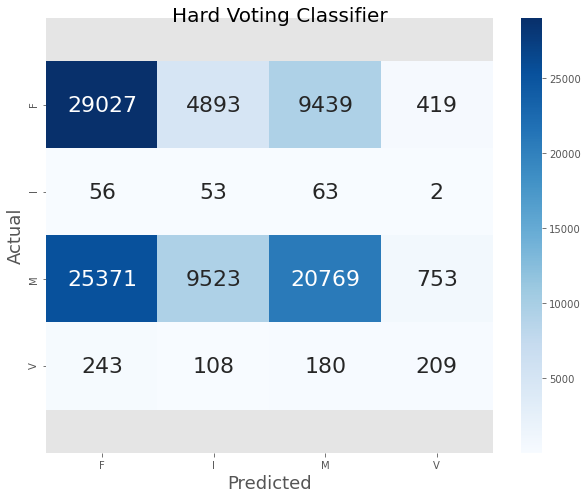

In [ ]:
cm7 = confusion_matrix(y_test,hard_voting_pred)
plot_confusionmatrix(y_test, hard_voting_pred, cm7, "Hard Voting Classifier")